In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
data=pd.read_csv(r"C:\Users\Rohit94\Documents\project_2023\Symptom to Specialist\Symptom.csv")

In [3]:
data

,Unnamed: 0,label,text
0,0,Psoriasis,I have been experiencing a skin rash on my arm...
1,1,Psoriasis,"My skin has been peeling, especially on my kne..."
2,2,Psoriasis,I have been experiencing joint pain in my fing...
3,3,Psoriasis,"There is a silver like dusting on my skin, esp..."
4,4,Psoriasis,"My nails have small dents or pits in them, and..."
...,...,...,...
1195,295,diabetes,I'm shaking and trembling all over. I've lost ...
1196,296,diabetes,"Particularly in the crevices of my skin, I hav..."
1197,297,diabetes,I regularly experience these intense urges and...
1198,298,diabetes,"I have trouble breathing, especially outside. ..."


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  1200 non-null   int64 
 1   label       1200 non-null   object
 2   text        1200 non-null   object
dtypes: int64(1), object(2)
memory usage: 28.2+ KB


In [5]:
data.columns

Index(['Unnamed: 0', 'label', 'text'], dtype='object')

In [6]:
data["label"].value_counts()

Psoriasis                          50
Varicose Veins                     50
peptic ulcer disease               50
drug reaction                      50
gastroesophageal reflux disease    50
allergy                            50
urinary tract infection            50
Malaria                            50
Jaundice                           50
Cervical spondylosis               50
Migraine                           50
Hypertension                       50
Bronchial Asthma                   50
Acne                               50
Arthritis                          50
Dimorphic Hemorrhoids              50
Pneumonia                          50
Common Cold                        50
Fungal infection                   50
Dengue                             50
Impetigo                           50
Chicken pox                        50
Typhoid                            50
diabetes                           50
Name: label, dtype: int64

In [7]:
data.describe()

,Unnamed: 0
count,1200.000000
mean,149.500000
std,86.638166
min,0.000000
25%,74.750000
50%,149.500000
75%,224.250000
max,299.000000


In [8]:
data.isnull().sum()

Unnamed: 0    0
label         0
text          0
dtype: int64

In [9]:
import plotly.express as px

figure = px.treemap(data, path=[px.Constant('all'), 'label'],title='Distribution of Diseases in the Dataset')
figure.update_traces(root_color='lightgrey')
figure.update_layout(width=900, height=600)
figure.show()

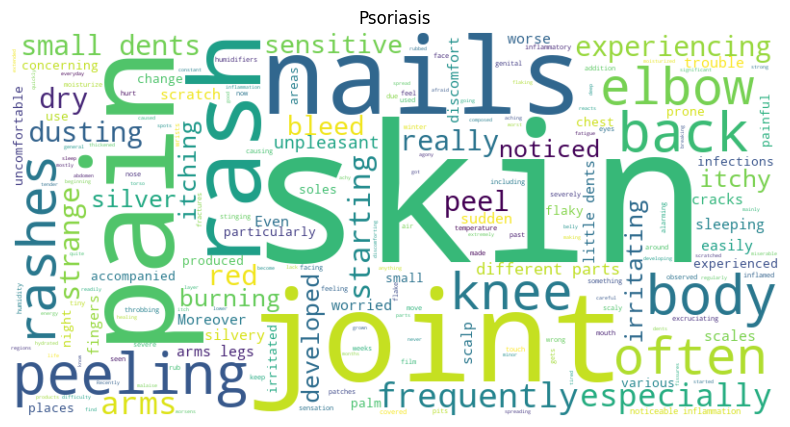

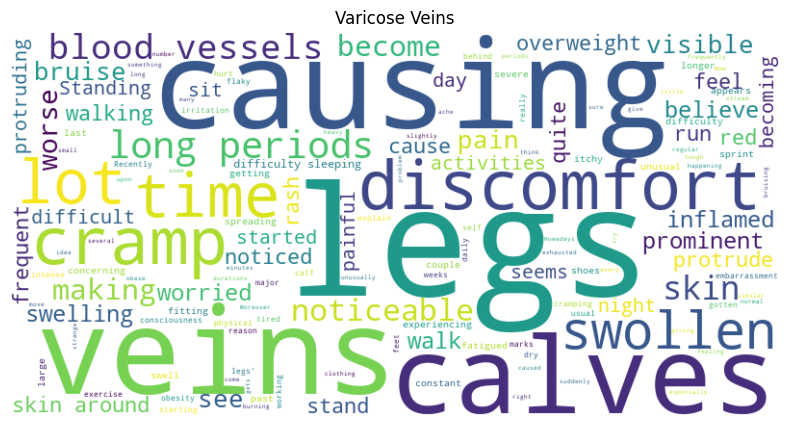

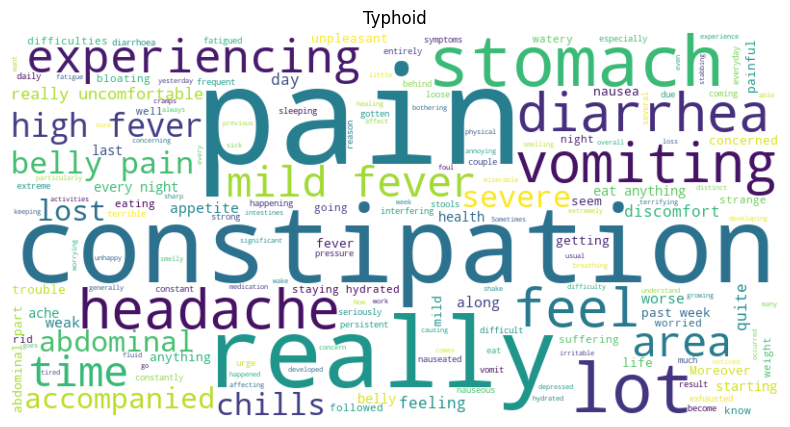

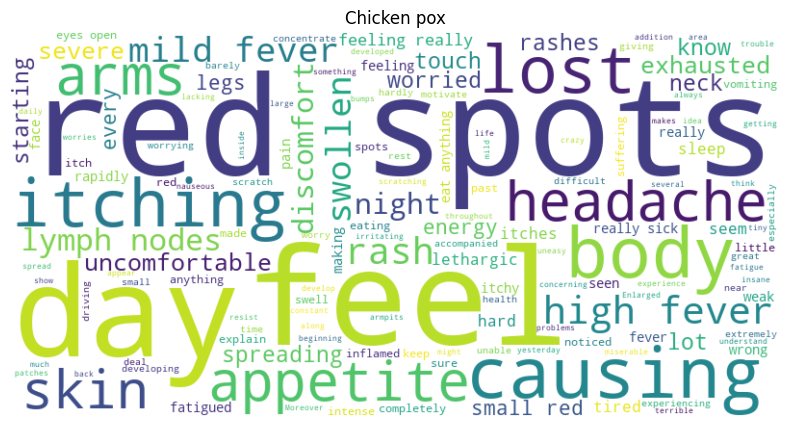

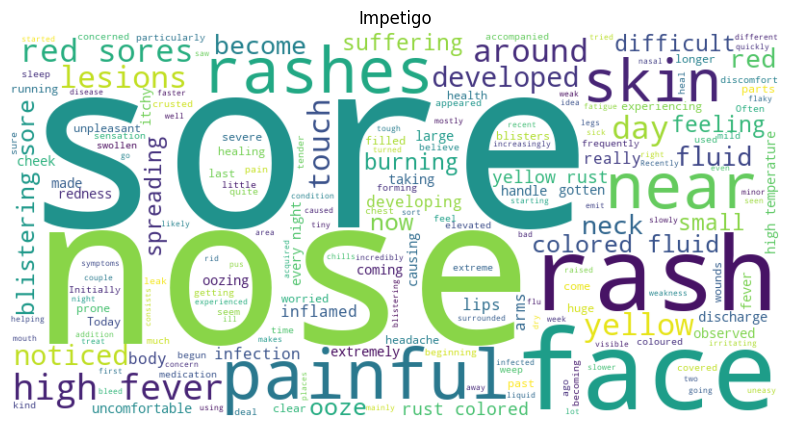

...

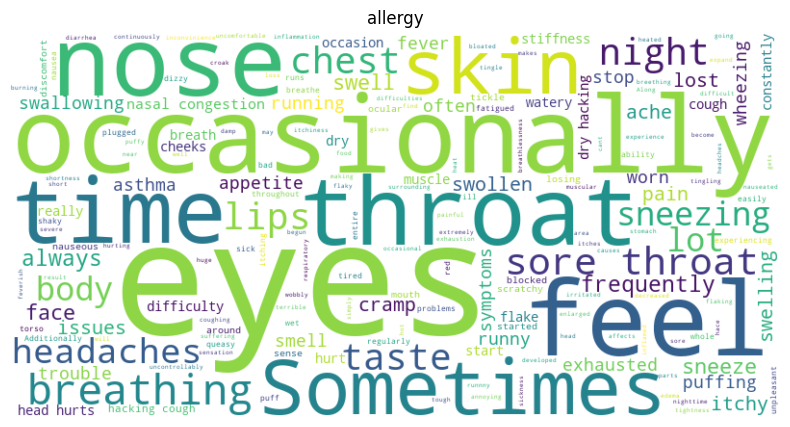

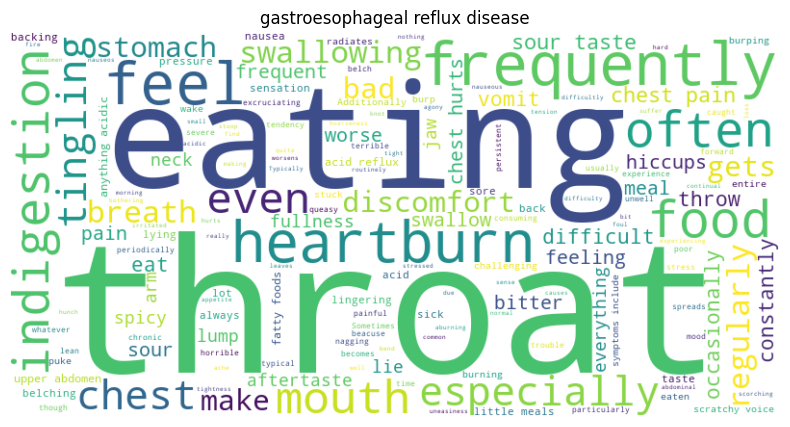

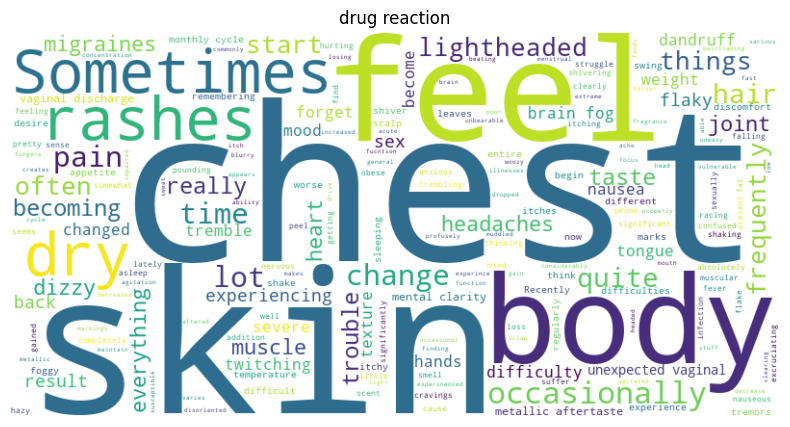

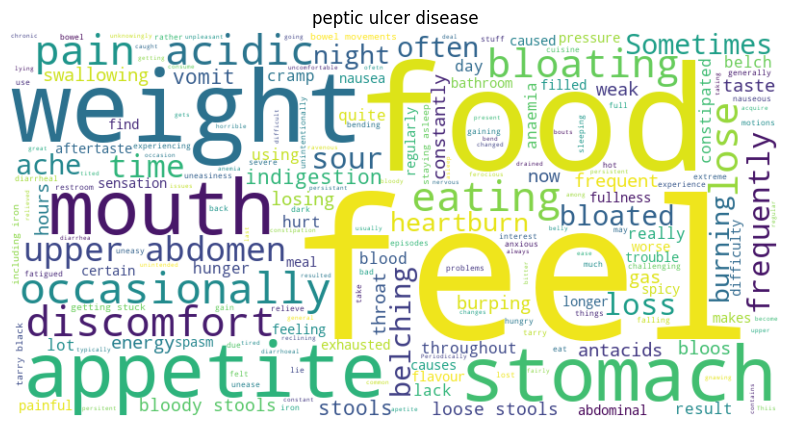

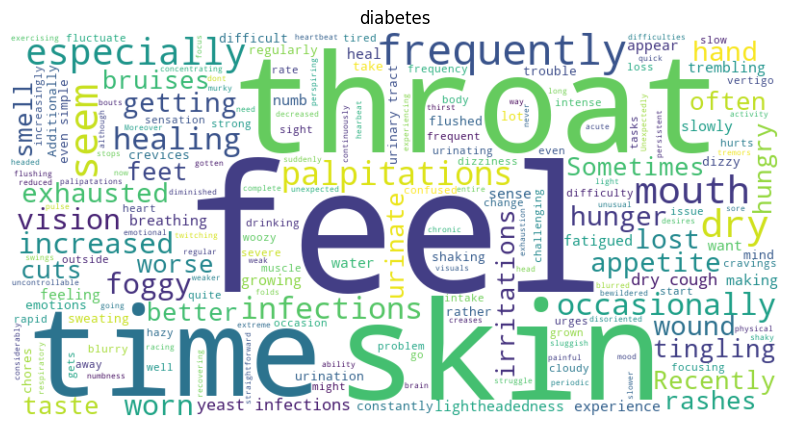

In [10]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict

text_by_label = defaultdict(str)

# Group text data by label
for label, text in zip(data['label'], data['text']):
    text_by_label[label] += text + ' '

# Generate word clouds for each label
for label, text in text_by_label.items():
    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Display word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(label)  # Set title as the current label
    plt.axis('off')
    plt.show()


In [11]:
X = data['text']

In [12]:
X

0       I have been experiencing a skin rash on my arm...
1       My skin has been peeling, especially on my kne...
2       I have been experiencing joint pain in my fing...
3       There is a silver like dusting on my skin, esp...
4       My nails have small dents or pits in them, and...
                              ...                        
1195    I'm shaking and trembling all over. I've lost ...
1196    Particularly in the crevices of my skin, I hav...
1197    I regularly experience these intense urges and...
1198    I have trouble breathing, especially outside. ...
1199    I constantly sneeze and have a dry cough. My i...
Name: text, Length: 1200, dtype: object

In [13]:
y=data["label"]

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer
cv = TfidfVectorizer(use_idf=True,ngram_range=(2,2))
# X = cv.fit_transform(corpus).toarray()

In [15]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

In [16]:
#Extracting features of the training data
train_features = cv.fit(X_train)
train_features = cv.transform(X_train)
# #Extracting features of the test data
test_features = cv.transform(X_test)

In [17]:
train_features

<960x7881 sparse matrix of type '<class 'numpy.float64'>'
	with 25646 stored elements in Compressed Sparse Row format>

In [18]:
test_features

<240x7881 sparse matrix of type '<class 'numpy.float64'>'
	with 5311 stored elements in Compressed Sparse Row format>

In [19]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import metrics

In [20]:
# Fitting Naive Bayes to the Training set
from sklearn.naive_bayes import MultinomialNB
nb_classifier = MultinomialNB()
nb_classifier.fit(train_features, y_train)

nb_y_pred = nb_classifier.predict(test_features)

x = metrics.accuracy_score(y_test, nb_y_pred)
print("Naive Bayes's Accuracy is: ", x*100)
print(classification_report(y_test,nb_y_pred))

Naive Bayes's Accuracy is:  87.91666666666667
                                 precision    recall  f1-score   support

                           Acne       1.00      1.00      1.00        13
                      Arthritis       0.85      1.00      0.92        11
               Bronchial Asthma       1.00      1.00      1.00         9
           Cervical spondylosis       0.78      1.00      0.88         7
                    Chicken pox       0.80      0.89      0.84         9
                    Common Cold       0.82      0.90      0.86        10
                         Dengue       0.71      0.83      0.77         6
          Dimorphic Hemorrhoids       0.79      1.00      0.88        11
               Fungal infection       0.82      1.00      0.90         9
                   Hypertension       1.00      0.93      0.97        15
                       Impetigo       0.82      1.00      0.90         9
                       Jaundice       1.00      1.00      1.00        13
    

In [21]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
DecisionTree = DecisionTreeClassifier(criterion="entropy",random_state=2,max_depth=5)

DecisionTree.fit(train_features,y_train)

predicted_values = DecisionTree.predict(test_features)
x = metrics.accuracy_score(y_test, predicted_values)


print("DecisionTrees's Accuracy is: ", x*100)

print(classification_report(y_test,predicted_values))

DecisionTrees's Accuracy is:  32.083333333333336
                                 precision    recall  f1-score   support

                           Acne       0.87      1.00      0.93        13
                      Arthritis       1.00      0.82      0.90        11
               Bronchial Asthma       0.00      0.00      0.00         9
           Cervical spondylosis       0.58      1.00      0.74         7
                    Chicken pox       0.24      0.44      0.31         9
                    Common Cold       0.00      0.00      0.00        10
                         Dengue       0.00      0.00      0.00         6
          Dimorphic Hemorrhoids       1.00      1.00      1.00        11
               Fungal infection       1.00      0.44      0.62         9
                   Hypertension       0.00      0.00      0.00        15
                       Impetigo       0.00      0.00      0.00         9
                       Jaundice       1.00      0.85      0.92        13
 

C:\Users\Rohit94\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Rohit94\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Rohit94\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [22]:
from sklearn.ensemble import RandomForestClassifier

# Create the Random Forest Classifier
RandomForest = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the Random Forest Classifier
RandomForest.fit(train_features, y_train)

# Make predictions on the test data
predicted_values_rf = RandomForest.predict(test_features)

# Calculate accuracy
accuracy_rf = metrics.accuracy_score(y_test, predicted_values_rf)
print("Random Forest's Accuracy is: ", accuracy_rf * 100)

# Print classification report
print(classification_report(y_test, predicted_values_rf))


Random Forest's Accuracy is:  87.91666666666667
                                 precision    recall  f1-score   support

                           Acne       1.00      1.00      1.00        13
                      Arthritis       1.00      0.91      0.95        11
               Bronchial Asthma       1.00      1.00      1.00         9
           Cervical spondylosis       1.00      1.00      1.00         7
                    Chicken pox       0.73      0.89      0.80         9
                    Common Cold       1.00      1.00      1.00        10
                         Dengue       0.57      0.67      0.62         6
          Dimorphic Hemorrhoids       0.92      1.00      0.96        11
               Fungal infection       1.00      0.67      0.80         9
                   Hypertension       0.88      1.00      0.94        15
                       Impetigo       0.82      1.00      0.90         9
                       Jaundice       1.00      1.00      1.00        13
  

In [23]:
from sklearn.svm import SVC

# Create the SVM classifier
svm_classifier = SVC(kernel='linear')

# Train the SVM classifier
svm_classifier.fit(train_features, y_train)

# Make predictions on the test data
predicted_values_svm = svm_classifier.predict(test_features)

# Calculate accuracy
accuracy_svm = metrics.accuracy_score(y_test, predicted_values_svm)
print("SVM's Accuracy is: ", accuracy_svm * 100)

# Print classification report
print(classification_report(y_test, predicted_values_svm))


SVM's Accuracy is:  94.58333333333333
                                 precision    recall  f1-score   support

                           Acne       1.00      1.00      1.00        13
                      Arthritis       1.00      1.00      1.00        11
               Bronchial Asthma       1.00      1.00      1.00         9
           Cervical spondylosis       1.00      1.00      1.00         7
                    Chicken pox       0.89      0.89      0.89         9
                    Common Cold       1.00      1.00      1.00        10
                         Dengue       0.83      0.83      0.83         6
          Dimorphic Hemorrhoids       1.00      1.00      1.00        11
               Fungal infection       1.00      0.89      0.94         9
                   Hypertension       1.00      1.00      1.00        15
                       Impetigo       0.82      1.00      0.90         9
                       Jaundice       1.00      1.00      1.00        13
            

In [24]:
from sklearn.feature_extraction.text import CountVectorizer

# Create the CountVectorizer
cv = CountVectorizer(ngram_range=(2,2))

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

# Extracting features of the training data
train_features = cv.fit_transform(X_train)

# Extracting features of the test data
test_features = cv.transform(X_test)


In [25]:
# Fitting Naive Bayes to the Training set
from sklearn.naive_bayes import MultinomialNB
nb_classifier = MultinomialNB()
nb_classifier.fit(train_features, y_train)

nb_y_pred = nb_classifier.predict(test_features)

x = metrics.accuracy_score(y_test, nb_y_pred)
print("Naive Bayes's Accuracy is: ", x*100)
print(classification_report(y_test,nb_y_pred))

Naive Bayes's Accuracy is:  90.83333333333333
                                 precision    recall  f1-score   support

                           Acne       1.00      1.00      1.00        13
                      Arthritis       0.85      1.00      0.92        11
               Bronchial Asthma       1.00      1.00      1.00         9
           Cervical spondylosis       0.78      1.00      0.88         7
                    Chicken pox       0.82      1.00      0.90         9
                    Common Cold       0.83      1.00      0.91        10
                         Dengue       0.71      0.83      0.77         6
          Dimorphic Hemorrhoids       0.85      1.00      0.92        11
               Fungal infection       0.90      1.00      0.95         9
                   Hypertension       1.00      0.93      0.97        15
                       Impetigo       0.82      1.00      0.90         9
                       Jaundice       1.00      1.00      1.00        13
    

In [26]:
from sklearn.svm import SVC

# Create the SVM classifier
svm_classifier = SVC(kernel='linear')

# Train the SVM classifier
svm_classifier.fit(train_features, y_train)

# Make predictions on the test data
predicted_values_svm = svm_classifier.predict(test_features)

# Calculate accuracy
accuracy_svm = metrics.accuracy_score(y_test, predicted_values_svm)
print("SVM's Accuracy is: ", accuracy_svm * 100)

# Print classification report
print(classification_report(y_test, predicted_values_svm))


SVM's Accuracy is:  93.33333333333333
                                 precision    recall  f1-score   support

                           Acne       1.00      1.00      1.00        13
                      Arthritis       1.00      0.91      0.95        11
               Bronchial Asthma       1.00      0.89      0.94         9
           Cervical spondylosis       1.00      1.00      1.00         7
                    Chicken pox       0.90      1.00      0.95         9
                    Common Cold       1.00      1.00      1.00        10
                         Dengue       0.83      0.83      0.83         6
          Dimorphic Hemorrhoids       1.00      1.00      1.00        11
               Fungal infection       1.00      0.89      0.94         9
                   Hypertension       1.00      1.00      1.00        15
                       Impetigo       0.90      1.00      0.95         9
                       Jaundice       1.00      1.00      1.00        13
            

# Deep Learning Algorithm

In [27]:
import os
import pandas as pd
import tensorflow as tf
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.metrics import Precision, Recall, CategoricalAccuracy

In [28]:
data["label"].value_counts()

Psoriasis                          50
Varicose Veins                     50
peptic ulcer disease               50
drug reaction                      50
gastroesophageal reflux disease    50
allergy                            50
urinary tract infection            50
Malaria                            50
Jaundice                           50
Cervical spondylosis               50
Migraine                           50
Hypertension                       50
Bronchial Asthma                   50
Acne                               50
Arthritis                          50
Dimorphic Hemorrhoids              50
Pneumonia                          50
Common Cold                        50
Fungal infection                   50
Dengue                             50
Impetigo                           50
Chicken pox                        50
Typhoid                            50
diabetes                           50
Name: label, dtype: int64

In [29]:
data=data.replace(["Psoriasis","Varicose Veins","peptic ulcer disease","drug reaction","gastroesophageal reflux disease","allergy","urinary tract infection","Malaria","Jaundice","Cervical spondylosis","Migraine","Hypertension","Bronchial Asthma","Acne","Arthritis","Dimorphic Hemorrhoids","Pneumonia","Common Cold","Fungal infection","Dengue","Impetigo","Chicken pox","Typhoid","diabetes"],[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23])

In [30]:
data

,Unnamed: 0,label,text
0,0,0,I have been experiencing a skin rash on my arm...
1,1,0,"My skin has been peeling, especially on my kne..."
2,2,0,I have been experiencing joint pain in my fing...
3,3,0,"There is a silver like dusting on my skin, esp..."
4,4,0,"My nails have small dents or pits in them, and..."
...,...,...,...
1195,295,23,I'm shaking and trembling all over. I've lost ...
1196,296,23,"Particularly in the crevices of my skin, I hav..."
1197,297,23,I regularly experience these intense urges and...
1198,298,23,"I have trouble breathing, especially outside. ..."


In [31]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from sklearn.metrics import accuracy_score

# Preprocess the data
encoder = LabelEncoder()
data['label'] = encoder.fit_transform(data['label'])
X = data['text'].values
y = data['label'].values

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Tokenize the text data
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)
X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

# Pad sequences to ensure uniform length
max_sequence_length = 100  # Adjust as needed
X_train_pad = pad_sequences(X_train_seq, maxlen=max_sequence_length)
X_test_pad = pad_sequences(X_test_seq, maxlen=max_sequence_length)

# Define model architecture
vocab_size = len(tokenizer.word_index) + 1
embedding_dim = 100
num_classes = len(encoder.classes_)
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128, dropout=0.2, recurrent_dropout=0.2),
    Dense(units=num_classes, activation='softmax')
])

# Compile the model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_pad, y_train, epochs=20, batch_size=64, validation_split=0.2)

# Evaluate the model
loss, accuracy = model.evaluate(X_test_pad, y_test)
print(f'Test Loss: {loss}, Test Accuracy: {accuracy}')

# Make predictions
y_pred_proba = model.predict(X_test_pad)
y_pred = np.argmax(y_pred_proba, axis=1)  # Convert probabilities to class labels

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy on Test Set: {accuracy}')


Epoch 1/20
12/12 [==============================] - 5s 234ms/step - loss: 3.1678 - accuracy: 0.1745 - val_loss: 3.1510 - val_accuracy: 0.3490
Epoch 2/20
12/12 [==============================] - 2s 185ms/step - loss: 3.1091 - accuracy: 0.3672 - val_loss: 3.0578 - val_accuracy: 0.1771
Epoch 3/20
12/12 [==============================] - 2s 179ms/step - loss: 2.9621 - accuracy: 0.2083 - val_loss: 2.8921 - val_accuracy: 0.3490
Epoch 4/20
12/12 [==============================] - 2s 186ms/step - loss: 2.6909 - accuracy: 0.3711 - val_loss: 2.6143 - val_accuracy: 0.3021
Epoch 5/20
12/12 [==============================] - 2s 184ms/step - loss: 2.3235 - accuracy: 0.3763 - val_loss: 2.1601 - val_accuracy: 0.3854
Epoch 6/20
12/12 [==============================] - 2s 181ms/step - loss: 1.8322 - accuracy: 0.4844 - val_loss: 1.7659 - val_accuracy: 0.4948
Epoch 7/20
12/12 [==============================] - 2s 184ms/step - loss: 1.4125 - accuracy: 0.6419 - val_loss: 1.4089 - val_accuracy: 0.6198
Epoch 

In [32]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_test, y_pred, target_names=["Psoriasis","Varicose Veins","peptic ulcer disease","drug reaction","gastroesophageal reflux disease","allergy","urinary tract infection","Malaria","Jaundice","Cervical spondylosis","Migraine","Hypertension","Bronchial Asthma","Acne","Arthritis","Dimorphic Hemorrhoids","Pneumonia","Common Cold","Fungal infection","Dengue","Impetigo","Chicken pox","Typhoid","diabetes"])

# Print the classification report
print("Classification Report:\n", report)


Classification Report:
                                  precision    recall  f1-score   support

                      Psoriasis       0.50      0.50      0.50         6
                 Varicose Veins       0.80      1.00      0.89        12
           peptic ulcer disease       0.57      0.73      0.64        11
                  drug reaction       0.56      1.00      0.71         5
gastroesophageal reflux disease       1.00      0.45      0.62        11
                        allergy       0.73      0.67      0.70        12
        urinary tract infection       0.90      0.82      0.86        11
                        Malaria       1.00      1.00      1.00        11
                       Jaundice       1.00      1.00      1.00        11
           Cervical spondylosis       1.00      1.00      1.00         7
                       Migraine       0.91      1.00      0.95        10
                   Hypertension       0.89      0.80      0.84        10
               Bronchial A

# Multi Layer Perceptron

In [33]:
X

array(['I have been experiencing a skin rash on my arms, legs, and torso for the past few weeks. It is red, itchy, and covered in dry, scaly patches.',
       'My skin has been peeling, especially on my knees, elbows, and scalp. This peeling is often accompanied by a burning or stinging sensation.',
       'I have been experiencing joint pain in my fingers, wrists, and knees. The pain is often achy and throbbing, and it gets worse when I move my joints.',
       ...,
       "I regularly experience these intense urges and the want to urinate. I frequently feel drowsy and lost. I've also significantly lost my vision.",
       'I have trouble breathing, especially outside. I start to feel hot and start to sweat. I frequently have urinary tract infections and yeast infections.',
       "I constantly sneeze and have a dry cough. My infections don't seem to be healing, and I have palpitations. My throat does ache occasionally, but it usually gets better."],
      dtype=object)

In [34]:
y

array([ 0,  0,  0, ..., 23, 23, 23], dtype=int64)

In [35]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd



In [36]:

# Preprocess the text data
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(data['text']).toarray()



In [37]:
X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [38]:
# Encode the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(data['label'])



In [39]:
y

array([ 0,  0,  0, ..., 23, 23, 23], dtype=int64)

In [40]:

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define hyperparameters
input_size = X_train.shape[1]
hidden_size1 = 128
hidden_size2 = 64
num_classes = len(label_encoder.classes_)
learning_rate = 0.001
num_epochs = 15
batch_size = 32

In [41]:

# Define the MLP model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden_size1, activation='relu', input_shape=(input_size,)),
    tf.keras.layers.Dense(hidden_size2, activation='relu'),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_split=0.2)

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy}')


Epoch 1/15
24/24 [==============================] - 1s 13ms/step - loss: 2.9980 - accuracy: 0.2917 - val_loss: 2.7171 - val_accuracy: 0.5000
Epoch 2/15
24/24 [==============================] - 0s 8ms/step - loss: 2.1921 - accuracy: 0.6862 - val_loss: 1.7644 - val_accuracy: 0.6771
Epoch 3/15
24/24 [==============================] - 0s 8ms/step - loss: 1.1161 - accuracy: 0.9076 - val_loss: 0.8994 - val_accuracy: 0.8958
Epoch 4/15
24/24 [==============================] - 0s 8ms/step - loss: 0.4322 - accuracy: 0.9831 - val_loss: 0.5008 - val_accuracy: 0.9271
Epoch 5/15
24/24 [==============================] - 0s 7ms/step - loss: 0.1719 - accuracy: 0.9961 - val_loss: 0.3097 - val_accuracy: 0.9531
Epoch 6/15
24/24 [==============================] - 0s 9ms/step - loss: 0.0824 - accuracy: 0.9974 - val_loss: 0.2454 - val_accuracy: 0.9531
Epoch 7/15
24/24 [==============================] - 0s 10ms/step - loss: 0.0478 - accuracy: 1.0000 - val_loss: 0.2022 - val_accuracy: 0.9583
Epoch 8/15
24/24 [

In [42]:
label_mapping = {
    0: "Psoriasis",
    1: "Varicose Veins",
    2: "peptic ulcer disease",
    3: "drug reaction",
    4: "gastroesophageal reflux disease",
    5: "allergy",
    6: "urinary tract infection",
    7: "Malaria",
    8: "Jaundice",
    9: "Cervical spondylosis",
    10: "Migraine",
    11: "Hypertension",
    12: "Bronchial Asthma",
    13: "Acne",
    14: "Arthritis",
    15: "Dimorphic Hemorrhoids",
    16: "Pneumonia",
    17: "Common Cold",
    18: "Fungal infection",
    19: "Dengue",
    20: "Impetigo",
    21: "Chicken pox",
    22: "Typhoid",
    23: "diabetes"
}

import numpy as np

# Predict on the test set
y_pred = model.predict(X_test)

# Convert NumPy array to list of integers
y_pred_int = np.argmax(y_pred, axis=1).tolist()

# Decode labels
y_test_decoded = [label_mapping[label] for label in y_test]
y_pred_decoded = [label_mapping[label] for label in y_pred_int]

# Generate classification report
print(classification_report(y_test_decoded, y_pred_decoded))



8/8 [==============================] - 0s 2ms/step
                                 precision    recall  f1-score   support

                           Acne       1.00      1.00      1.00         7
                      Arthritis       1.00      1.00      1.00        10
               Bronchial Asthma       1.00      1.00      1.00        11
           Cervical spondylosis       1.00      1.00      1.00         7
                    Chicken pox       1.00      0.92      0.96        12
                    Common Cold       1.00      0.92      0.96        12
                         Dengue       0.92      1.00      0.96        12
          Dimorphic Hemorrhoids       1.00      1.00      1.00         7
               Fungal infection       1.00      1.00      1.00        13
                   Hypertension       1.00      1.00      1.00        10
                       Impetigo       1.00      1.00      1.00        11
                       Jaundice       1.00      1.00      1.00        11

In [43]:
model.save("SymptomtoSpecialist.h5")

In [44]:
import pickle

# Save the vectorizer
with open("vectorizer.pkl", "wb") as f:
    pickle.dump(vectorizer, f)


In [45]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pickle

# Load the saved model
model = tf.keras.models.load_model("SymptomtoSpecialist.h5")

# Load the vectorizer
with open("vectorizer.pkl", "rb") as f:
    vectorizer = pickle.load(f)

input_text = "I frequently feel the want to urinate and have these strong cravings. I get woozy and disoriented a lot. Moreover, I have lost my vision considerably"

# Preprocess the input text using the loaded vectorizer
input_sequence = vectorizer.transform([input_text]).toarray()

# Make predictions
predictions = model.predict(input_sequence)

# Decode the predictions
predicted_label = [predictions.argmax()][0]

# Print the predicted label
print("Predicted Label:", predicted_label)


1/1 [==============================] - 0s 49ms/step
Predicted Label: 23


In [46]:
import tensorflow as tf

# Load the Keras model
model = tf.keras.models.load_model("SymptomtoSpecialist.h5")

# Convert the model to TensorFlow Lite format
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the TensorFlow Lite model to a file
with open("SymptomtoSpecialist.tflite", "wb") as f:
    f.write(tflite_model)


INFO:tensorflow:Assets written to: C:\Users\Rohit94\AppData\Local\Temp\tmphugy73_o\assets
